In [143]:
import pandas as pd
import numpy as np

import seaborn as sns
sns.set(font="Times New Roman")

import matplotlib.pyplot as plt
import matplotlib_inline
import matplotlib
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
matplotlib.rcParams['font.family'] = 'Times New Roman'
# plt.rcParams.update({'font.size': 12})

import sys
sys.path.append("../../")


from MyMLLibrary import Helper as h



Na początek importujemy dane treningowe i zwracamy na wyjście kilka wierszy utworzonego DataFrame.

In [144]:
df_train = pd.read_csv('train.csv')
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


Następnie zwracamy trochę informacji o tym, jakie znajdują się cechy w zbiorze ich typ danych itp.

In [145]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

Następnie wyświetlamy wszystkie kolumny w formie listy.

In [146]:
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

Teraz dowiadujemy się nieco więcej o statystycznych danych poszczególny cech ilościowych (numerycznych).

In [147]:
df_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


W naszym problemie będziemy próbowac przewidzieć `SalePrice` zatem próbujemy dowiedzieć się szczegółowych danych statystycznych o tej cesze.

In [148]:
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

Zauważamy, że ceny są typu float64, a ich średnia wynosi ok. 180 tys. dolarów. Najtańszy dom można kupić za ok. 35 tys. dolarów, z kolei najdroższy za 750 tys.

W następnym kroku dokonujemy wizualizacji tej cechy przy pomocy histogramu oraz krzywej kde (krzywa gęstości prawdopodobieństwa -> rozkład obserwacji w zbiorze.)

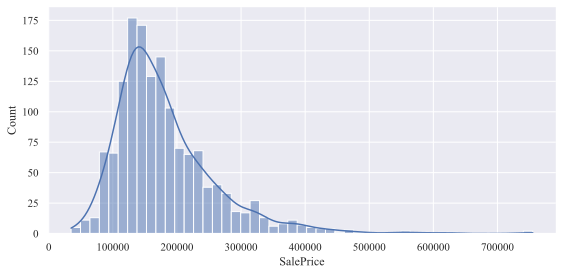

In [149]:
displot = sns.displot(df_train['SalePrice'], kind='hist', kde=True, height=4, aspect=2)


Zauważamy, że rozkład tej cechy nie jest normalny. Jest prawo skośny (długi prawy ogon) oraz jego kurtoza jestdwukrotnie większa od tej w normalnym rozkładzie. Jest to ważne spostrzeżenie, ponieważ po standaryzacji, taki rozkład zostałby wciśnięty w bardzo mały zakres, a modele ML tego nie lubią. Jednym rozwiązaniem tego problemu będzie (dla dodatnich cech) zpierwiatkowanie cechy, jeśli ogon jest baaaardzo długi można użyć logarytmu.

In [150]:
print("Skewness: %f" % df_train['SalePrice'].skew())
print("Kurtosis: %f" % df_train['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


Pozbywamy się kolumn `Id`, ponieważ nic nie wnosi do przewidywania `Sale Price` domu.

In [151]:
df_train.drop(['Id'], axis=1, inplace=True)
df_train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


Dla cech ilościowych wizualizujemy ich rozkłady przy pomocy histogramów.

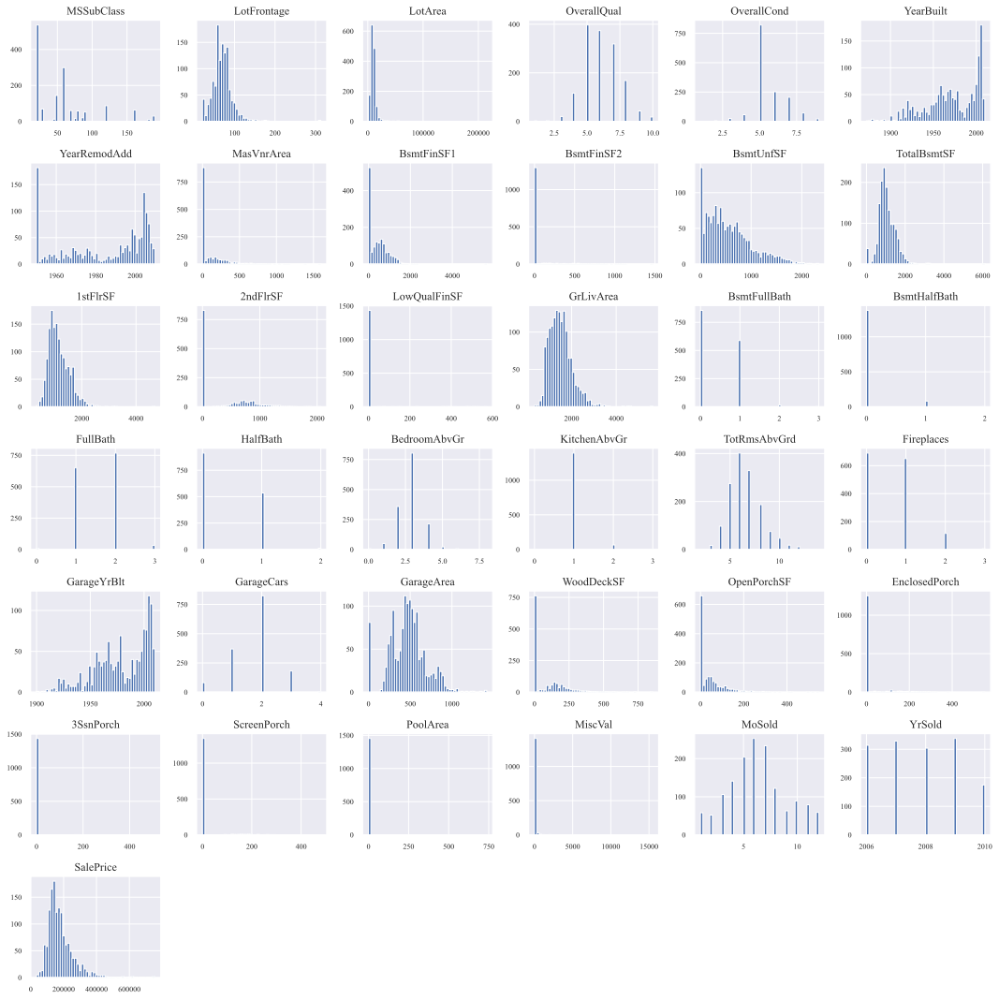

In [152]:
df_train.hist(figsize=(15,15), bins=50, xlabelsize=8, ylabelsize=8)
plt.tight_layout()

Aby dowiedzieć się więcej o zależnościach między cechami, a dokładniej między `SalePrice`, a pozostałymi, liczymy współczynniki korelacji (macierz korelacji)

In [153]:
correlation_matrix = df_train.corr(numeric_only=True)

Następnie wizualizujemy macierz. Jasne kolory odpowiadają wysokiej korelacji pozytywnej, a ciemne niskie negatywnej.

<Axes: >

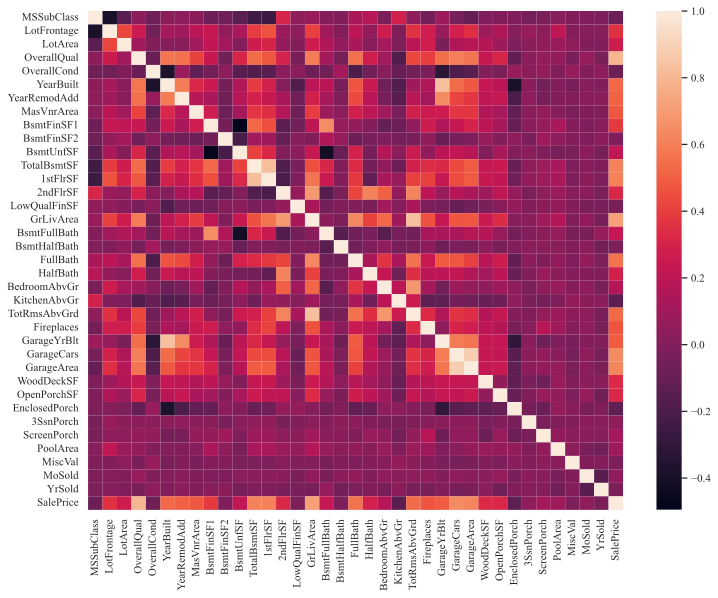

In [154]:
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(correlation_matrix)

Jednakże z powodu wielości cech wybieramy 10 o najwyższej korelacji

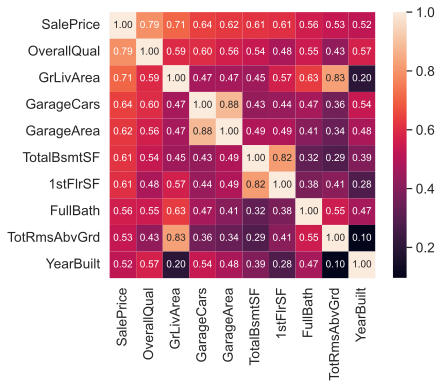

In [155]:
k = 10 
cols = np.abs(correlation_matrix).nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(df_train[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()


Innym sposobem wydorębnienia najabrdziej skolerowanych cech jest posortowanie ich i wybranie tych o największym pozytywny lub najmniejszym negatywnym współczynniku.

In [156]:
correlation_matrix['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePrice, dtype: float64

Najbardziej obiecujące są cechy: `OverallQual`, `GrLivArea`, `GarageCars` (odrzucamy `GarageArea`, ponieważ bardziej informatywną cechą jest ile garaż samochodów pomieści, cechy te zresztą są bardzo mocno ze sobą skorelowane, bo prawie w 90%), `TotalBsmtSF`, `FullBath`, `YearBuilt`. 

Dla tych cech wizualizujemy ich korelacje poprzez zestawienie ich ze sobą w przestrzeni przy pomocy scatter matrix.

In [157]:
from pandas.plotting import scatter_matrix
attributes = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']

scatter_matrix(df_train[attributes], figsize=(15, 15))
plt.tight_layout()
plt.show()

Obserwując ponownie histogramy zauważamy, że cecha `YearBuilt` ma rozkład multimodalny, jest to okazja do skorzystania z kernela rbf np.

Zauważamy też korelację `GrLivArea` z `TotalBsmtSF`, w której piwnica najczęściej ma tę samą powierzchnię co dom lub mniejszą. Zdarzają, się pojedyncze przypadki, w których tak nie jest (rzadko kiedy ktoś ma bunkier pod domem ;)).

Kilka cech numerycznych nie jest ciągłych tylko są reprezentowane przez skalę np. 1-10 tak jak w przypadku np. `OverallQual`, zauważamy również tutaj wysoką korelację jednakże punkty w przestrzeni układają się w pionowe linie.

Niektóre cechy mają brakujące dane. W następnym kroku zostaną usunięte wszystkie te cechy, których procent brakujących danych jest większy niż 85%

<Axes: >

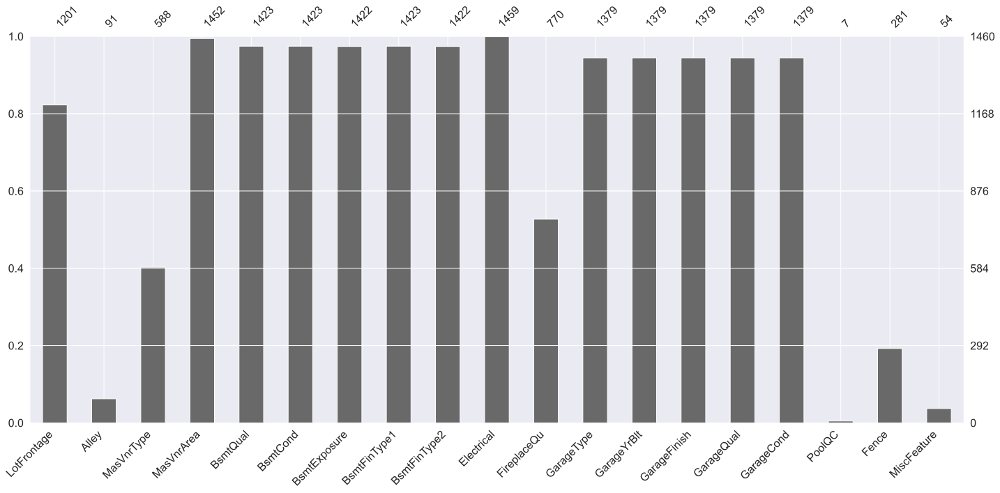

In [158]:
import missingno as msno

data_missing_values = df_train.loc[:, df_train.isnull().any()]

msno.bar(data_missing_values)


<Axes: >

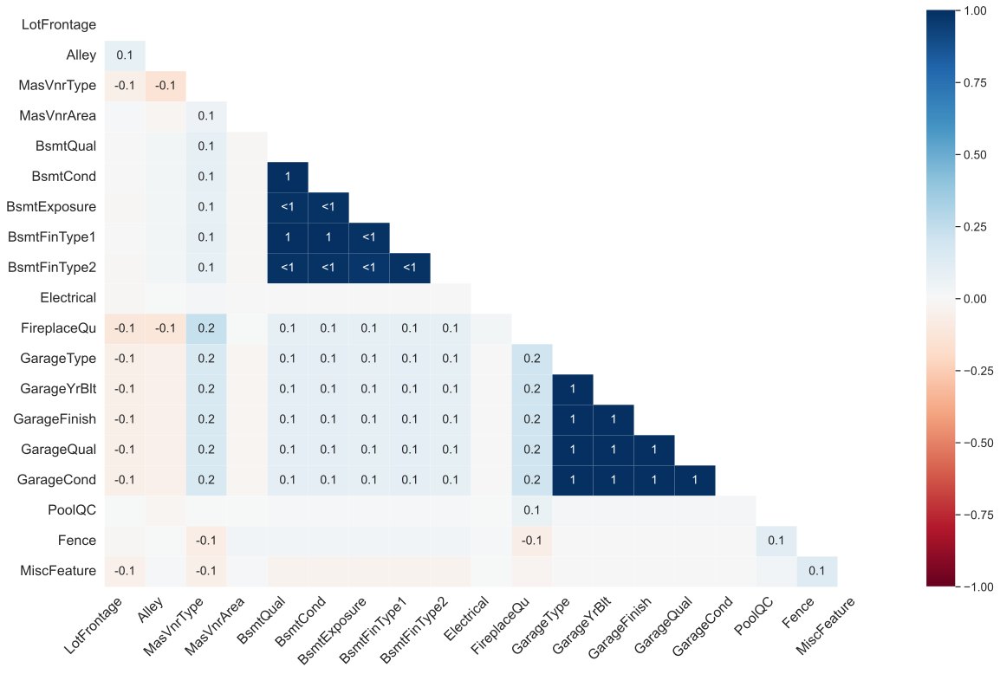

In [159]:
msno.heatmap(data_missing_values)

In [160]:
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)

missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
MasVnrType,872,0.597260
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageType,81,0.055479


Usuwamy wszystkie kolumny, czyli cechy, których brakujące dane wyniosły ponad 85%

In [161]:
df_train.drop((missing_data[missing_data['Total'] > 0.85*len(df_train.index)]).index, axis=1, inplace=True)

In [162]:
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)

missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
Fence,1179,0.807534
MasVnrType,872,0.597260
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageType,81,0.055479
GarageFinish,81,0.055479
GarageQual,81,0.055479
GarageCond,81,0.055479
GarageYrBlt,81,0.055479
BsmtFinType2,38,0.026027


Zauważam wysoką korelację na poziomie 80% `GarageYrBlt` z `YearBuilt`, więc postanawiam uzupełnić brakujące dane `GarageYrBlt` rokiem budowy domu.

In [163]:
df_train['GarageYrBlt'].fillna(df_train['YearBuilt'], inplace=True)

W kolumnie `Electrical` brakuje tylko jednej danej dlatego usuwam obserwację z brakującą cechą.

In [164]:
df_train.drop(df_train.loc[df_train['Electrical'].isnull()].index, inplace=True)
df_train.isnull().sum().max()

1178

W pozostałych przypadkach brak danych wynika z tego, że danego obiektu nie ma i nie można było go ocenić. Te wartości postanowiłam zastąpić stringiem 'NotExist'

In [165]:
from sklearn.impute import SimpleImputer

imputer_cat = SimpleImputer(strategy="constant", fill_value="NotExist")
df_train_cat = df_train.select_dtypes(include=[object])
X = imputer_cat.fit_transform(df_train_cat)
X_cat = pd.DataFrame(X, columns=df_train_cat.columns, index=df_train_cat.index)
X_cat

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Typ,NotExist,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,Typ,Gd,Detchd,Unf,TA,TA,Y,NotExist,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
1456,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,...,Min1,TA,Attchd,Unf,TA,TA,Y,MnPrv,WD,Normal
1457,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,...,Typ,Gd,Attchd,RFn,TA,TA,Y,GdPrv,WD,Normal
1458,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,...,Typ,NotExist,Attchd,Unf,TA,TA,Y,NotExist,WD,Normal


Natomiast w przypadku `LotFrontage` brakujące dane postanowiłam zastąpić medianą.

In [166]:
imputer_num = SimpleImputer(strategy="median")
df_train_num = df_train.select_dtypes(include=[np.number])
X = imputer_num.fit_transform(df_train_num)
X_num = pd.DataFrame(X, columns=df_train_num.columns, index=df_train_num.index)
X_num

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60.0,65.0,8450.0,7.0,5.0,2003.0,2003.0,196.0,706.0,0.0,...,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,208500.0
1,20.0,80.0,9600.0,6.0,8.0,1976.0,1976.0,0.0,978.0,0.0,...,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,181500.0
2,60.0,68.0,11250.0,7.0,5.0,2001.0,2002.0,162.0,486.0,0.0,...,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,223500.0
3,70.0,60.0,9550.0,7.0,5.0,1915.0,1970.0,0.0,216.0,0.0,...,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0,140000.0
4,60.0,84.0,14260.0,8.0,5.0,2000.0,2000.0,350.0,655.0,0.0,...,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60.0,62.0,7917.0,6.0,5.0,1999.0,2000.0,0.0,0.0,0.0,...,0.0,40.0,0.0,0.0,0.0,0.0,0.0,8.0,2007.0,175000.0
1456,20.0,85.0,13175.0,6.0,6.0,1978.0,1988.0,119.0,790.0,163.0,...,349.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2010.0,210000.0
1457,70.0,66.0,9042.0,7.0,9.0,1941.0,2006.0,0.0,275.0,0.0,...,0.0,60.0,0.0,0.0,0.0,0.0,2500.0,5.0,2010.0,266500.0
1458,20.0,68.0,9717.0,5.0,6.0,1950.0,1996.0,0.0,49.0,1029.0,...,366.0,0.0,112.0,0.0,0.0,0.0,0.0,4.0,2010.0,142125.0


Przy pomocy ColumnTransformera generujemy powyższe uzupełnianie danych przy pomocy jednej komendy i uzyskujemy nowy dataframe bez brakujących danych.

In [167]:
from sklearn.compose import ColumnTransformer, make_column_selector, make_column_transformer

# preprocessing = ColumnTransformer([
#     ("inputer1", SimpleImputer(strategy="median"), make_column_selector(dtype_include=np.number)),
#     ("imputer2", SimpleImputer(strategy="constant", fill_value="NotExist"), make_column_selector(dtype_include=object))],
#     remainder="passthrough",
#     verbose_feature_names_out=False
# ).set_output(transform="pandas")


preprocessing = make_column_transformer(
    (SimpleImputer(strategy="median"), make_column_selector(dtype_include=np.number)),
    (SimpleImputer(strategy="constant", fill_value="NotExist"), make_column_selector(dtype_include=object)),
    remainder="passthrough",
    verbose_feature_names_out=False
).set_output(transform="pandas")

preprocessing

ColumnTransformer(remainder='passthrough',
                  transformers=[('simpleimputer-1',
                                 SimpleImputer(strategy='median'),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x16f79df40>),
                                ('simpleimputer-2',
                                 SimpleImputer(fill_value='NotExist',
                                               strategy='constant'),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x16e23c190>)],
                  verbose_feature_names_out=False)

In [168]:
result = preprocessing.fit_transform(df_train)

In [169]:
result.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition
0,60.0,65.0,8450.0,7.0,5.0,2003.0,2003.0,196.0,706.0,0.0,...,Typ,NotExist,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
1,20.0,80.0,9600.0,6.0,8.0,1976.0,1976.0,0.0,978.0,0.0,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
2,60.0,68.0,11250.0,7.0,5.0,2001.0,2002.0,162.0,486.0,0.0,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
3,70.0,60.0,9550.0,7.0,5.0,1915.0,1970.0,0.0,216.0,0.0,...,Typ,Gd,Detchd,Unf,TA,TA,Y,NotExist,WD,Abnorml
4,60.0,84.0,14260.0,8.0,5.0,2000.0,2000.0,350.0,655.0,0.0,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal


In [170]:
houses_cat = result.select_dtypes(include=[object])
houses_cat.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Typ,NotExist,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,Typ,Gd,Detchd,Unf,TA,TA,Y,NotExist,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal


Następnie wizualizuje przy pomocy boxplot rozkłady poszczególnych atrybutów dla poszczególnej kategorii/cechy w zestawieniu z cecha `SalePrice`.

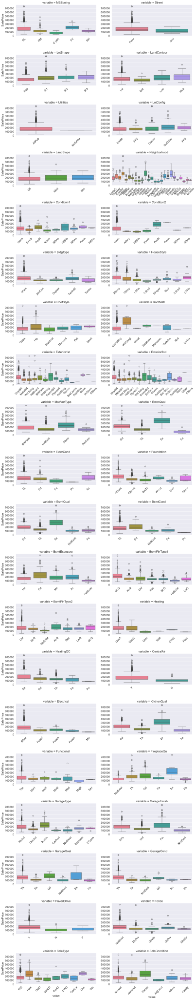

In [171]:
f = pd.melt(result, id_vars=["SalePrice"], value_vars=houses_cat)
g = sns.FacetGrid(f, col="variable", col_wrap=2, sharex=False, sharey=False, height=3.5, aspect=2)

g.map_dataframe(sns.boxplot, x="value", y="SalePrice", hue="value", palette="husl")

g.set_xticklabels(rotation=45)
g.set(yticks=range(0, 800000, 100000))

plt.tight_layout()
plt.show()

Po analizie boxplotów zauważam, że niższa cena jest zazwyczaj związana z wartością cechy "NotExist", czyli brakiem basenu, piwnicy itd.

Obserwują ponownie histogramy, aby sprawdzić, które rozkłady trzeba przed skalowanie zmodyfikować.

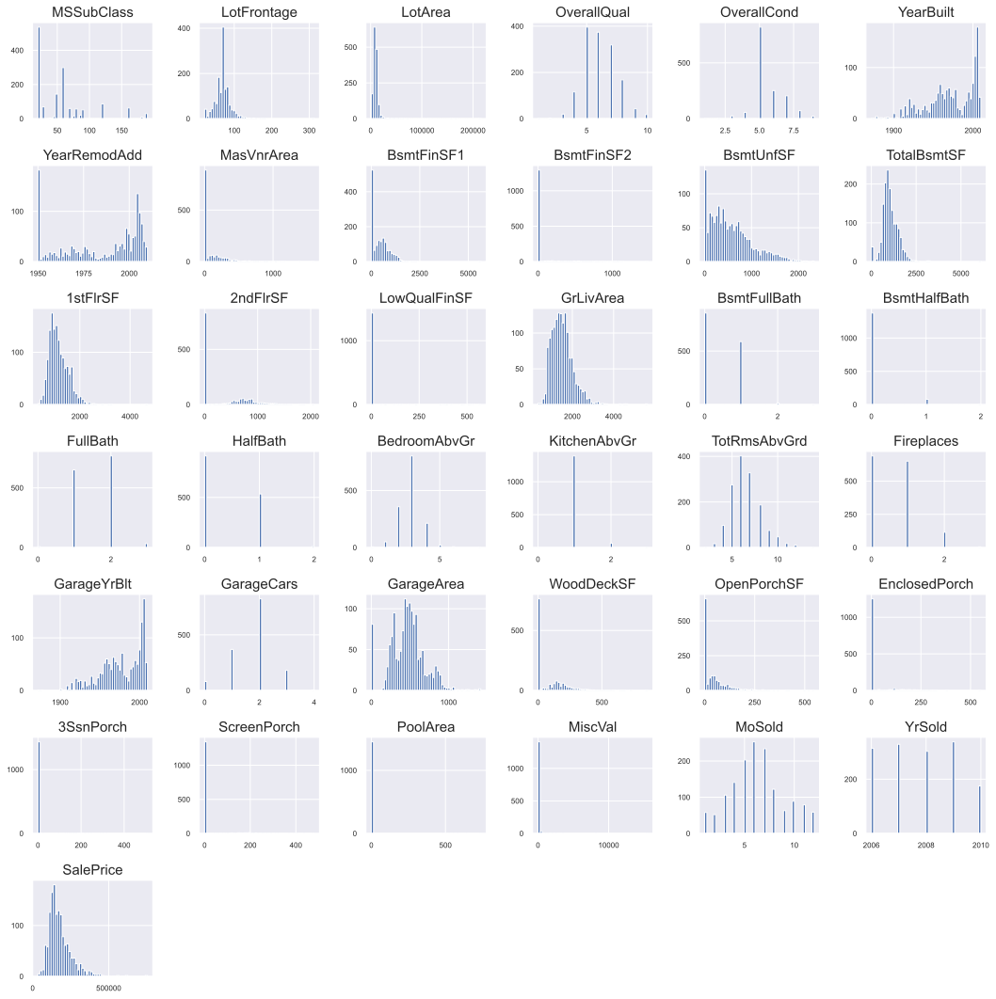

In [172]:
result.hist(figsize=(15,15), bins=50, xlabelsize=8, ylabelsize=8)
plt.tight_layout()

Przed skalowaniem danych wybrałam trzy ścieżki, według których dane zostaną odpowiednio przystosowane do uczenia modelu:
- dodanie cechy dla pików w rozkładach wielomodalnych,
- zlogarytmowanie rozkładów skośnych,
- zbucketyzowanie cech, w których w zerze jest bardzo wysoki pik.

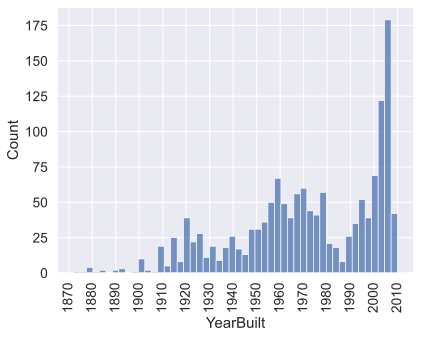

In [173]:
sns.histplot(result['YearBuilt'], bins=50)

xticks = range(1870, 2020, 10)
xticklabels = [str(x) for x in xticks]

plt.xticks(xticks, xticklabels, rotation=90)


plt.show()

Mamy trzy wyraźne piki w roku 1920, 1940, 1960 oraz w 2005

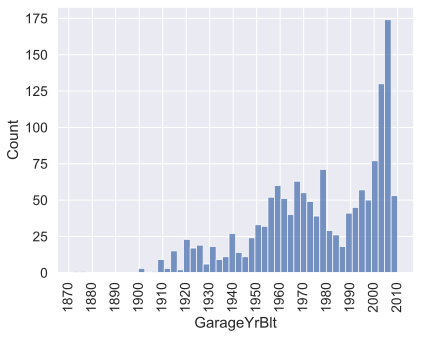

In [174]:
sns.histplot(result['GarageYrBlt'], bins=50)

xticks = range(1870, 2020, 10)
xticklabels = [str(x) for x in xticks]

plt.xticks(xticks, xticklabels, rotation=90)


plt.show()

Podobnie jak wyżej, tu mamy trzy wyraźne piki w roku 1920, 1940, 1960 oraz w 2005.

In [175]:
multimodal_attr = ['YearBuilt', 'GarageYrBlt']
# attributes = ['LotFrontage', 'LotArea', '1stFlrSF', 'GrLivArea', 'SalePrice']
attributes = ['1stFlrSF', 'GrLivArea', 'SalePrice']
attr_to_bucketize = ['YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF', 'LowQualFinSF', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']

Najpierw użyję jądra rbf, aby dodać trzy kolumny dla poszczególnych pików, ponieważ może modelują jakieś ciekawe zależności. Wyznaczymy miarę podobieństwa dla poszczególnych pików.

In [176]:
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.preprocessing import FunctionTransformer

def names(transformer, input):
    Y = transformer.get_params()['kw_args']['Y']
    result = []
    for elem in Y:
        result.append(f'{input[0]}_{elem[0]}')
    
    return result

preprocessor_year = make_column_transformer(
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1920]], gamma=0.02), feature_names_out=names), ['YearBuilt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1940]], gamma=0.1), feature_names_out=names), ['YearBuilt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1960]], gamma=0.01), feature_names_out=names), ['YearBuilt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[2005]], gamma=0.01), feature_names_out=names), ['YearBuilt']),
    ('passthrough', ['YearBuilt']),
    remainder="passthrough",
    verbose_feature_names_out=False
).set_output(transform='pandas')

kernel_result = preprocessor_year.fit_transform(result.sort_values(by='YearBuilt'))


kernel_result


,YearBuilt_1920,YearBuilt_1940,YearBuilt_1960,YearBuilt_2005,YearBuilt,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,...,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition
1349,9.720985e-21,1.521359e-201,2.334723e-34,1.505390e-77,1872.0,70.0,50.0,5250.0,8.0,5.0,...,Typ,NotExist,NotExist,NotExist,NotExist,NotExist,Y,NotExist,WD,Normal
1137,2.576757e-18,3.240271e-184,4.190093e-32,4.020060e-74,1875.0,50.0,54.0,6342.0,5.0,8.0,...,Typ,NotExist,NotExist,NotExist,NotExist,NotExist,N,NotExist,WD,Normal
747,1.266417e-14,4.508027e-157,1.603811e-28,1.385119e-68,1880.0,70.0,65.0,11700.0,7.0,7.0,...,Typ,Gd,Detchd,Unf,TA,TA,N,NotExist,WD,Normal
304,1.266417e-14,4.508027e-157,1.603811e-28,1.385119e-68,1880.0,75.0,87.0,18386.0,7.0,9.0,...,Typ,Ex,Attchd,Unf,TA,TA,Y,NotExist,WD,Normal
1132,1.266417e-14,4.508027e-157,1.603811e-28,1.385119e-68,1880.0,70.0,90.0,9900.0,6.0,4.0,...,Typ,NotExist,Detchd,Unf,Fa,TA,N,NotExist,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507,1.581496e-69,1.707643e-207,3.737571e-11,8.521438e-01,2009.0,20.0,75.0,7862.0,6.0,5.0,...,Typ,NotExist,Attchd,Fin,TA,TA,Y,NotExist,New,Partial
460,1.581496e-69,1.707643e-207,3.737571e-11,8.521438e-01,2009.0,60.0,75.0,8004.0,8.0,5.0,...,Typ,NotExist,BuiltIn,Fin,TA,TA,Y,NotExist,New,Partial
103,1.581496e-69,1.707643e-207,3.737571e-11,8.521438e-01,2009.0,20.0,94.0,10402.0,7.0,5.0,...,Typ,NotExist,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
914,1.581496e-69,1.707643e-207,3.737571e-11,8.521438e-01,2009.0,160.0,30.0,3000.0,6.0,5.0,...,Typ,NotExist,Detchd,RFn,TA,TA,Y,NotExist,New,Partial


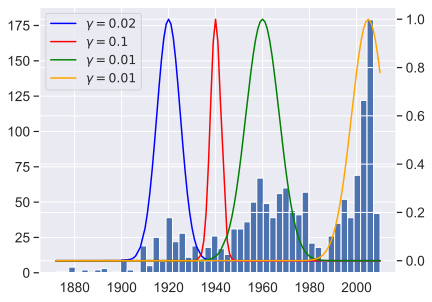

In [177]:
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots()

ax1.hist(result["YearBuilt"], bins=50)

ax2 = ax1.twinx() 
ax2.plot(kernel_result["YearBuilt"], kernel_result["YearBuilt_1920"], color="blue", label=r"$\gamma = 0.02$")
ax2.plot(kernel_result["YearBuilt"], kernel_result["YearBuilt_1940"], color="red", label=r"$\gamma = 0.1$")
ax2.plot(kernel_result["YearBuilt"], kernel_result["YearBuilt_1960"], color="green", label=r"$\gamma = 0.01$")
ax2.plot(kernel_result["YearBuilt"], kernel_result["YearBuilt_2005"], color="orange", label=r"$\gamma = 0.01$")

ax2.legend(loc="upper left", fontsize="small")

plt.show()


In [178]:
preprocessor_garage = make_column_transformer(
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1920]], gamma=0.02), feature_names_out=names), ['GarageYrBlt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1940]], gamma=0.1), feature_names_out=names), ['GarageYrBlt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1960]], gamma=0.01), feature_names_out=names), ['GarageYrBlt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[2005]], gamma=0.01), feature_names_out=names), ['GarageYrBlt']),
    ('passthrough', ['GarageYrBlt']),
    remainder="passthrough",
    verbose_feature_names_out=False
).set_output(transform='pandas')


kernel_result = preprocessor_garage.fit_transform(kernel_result.sort_values(by='GarageYrBlt'))

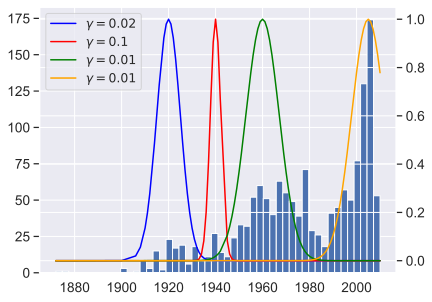

In [179]:
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots()

ax1.hist(kernel_result["GarageYrBlt"], bins=50)

ax2 = ax1.twinx() 

ax2.plot(kernel_result["GarageYrBlt"], kernel_result["GarageYrBlt_1920"], color="blue", label=r"$\gamma = 0.02$")
ax2.plot(kernel_result["GarageYrBlt"], kernel_result["GarageYrBlt_1940"], color="red", label=r"$\gamma = 0.1$")
ax2.plot(kernel_result["GarageYrBlt"], kernel_result["GarageYrBlt_1960"], color="green", label=r"$\gamma = 0.01$")
ax2.plot(kernel_result["GarageYrBlt"], kernel_result["GarageYrBlt_2005"], color="orange", label=r"$\gamma = 0.01$")

ax2.legend(loc="upper left", fontsize="small")

plt.show()


In [180]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import make_pipeline

distribution = make_column_transformer(
        (FunctionTransformer(np.log, feature_names_out='one-to-one', inverse_func=np.exp), attributes),
    remainder="passthrough",
    verbose_feature_names_out=False
    ).set_output(transform="pandas")

result2 = distribution.fit_transform(kernel_result)


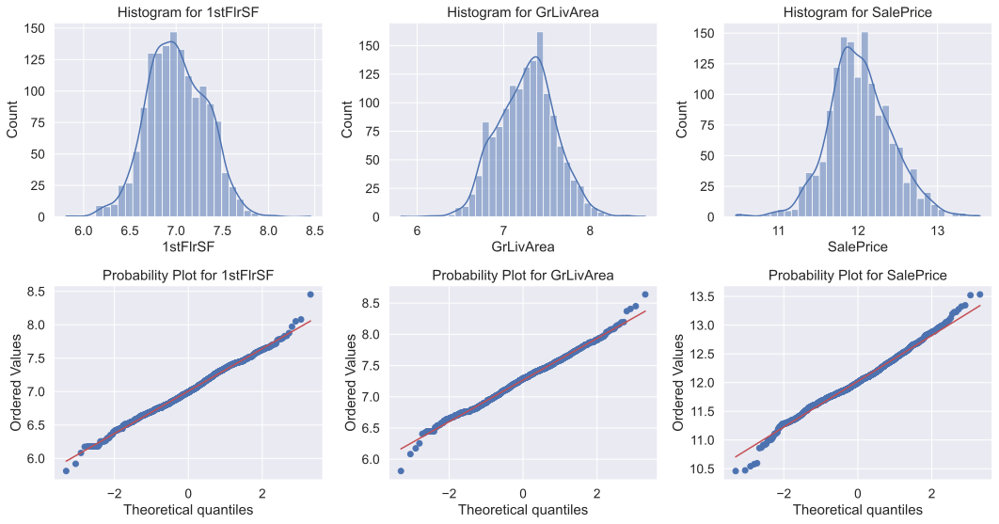

In [181]:
from scipy import stats

fig, axes = plt.subplots(2, len(attributes), figsize=(15, 8))

for i, attribute in enumerate(attributes):
    sns.histplot(result2[attribute], kde=True, ax=axes[0, i])
    axes[0, i].set_title(f'Histogram for {attribute}')
    
    res = stats.probplot(result2[attribute], plot=axes[1, i])
    axes[1, i].set_title(f'Probability Plot for {attribute}')

plt.tight_layout()
plt.show()

In [182]:
from sklearn.preprocessing import KBinsDiscretizer

discretizer = make_column_transformer(
    (KBinsDiscretizer(n_bins=5, encode="onehot-dense", strategy="kmeans"), attr_to_bucketize),
    ("passthrough", attr_to_bucketize),
    remainder='passthrough',
    verbose_feature_names_out=False
).set_output(transform="pandas")

result3 = discretizer.fit_transform(result2)

/Users/joannaadamczyk/opt/anaconda3/envs/ML/lib/python3.9/site-packages/sklearn/preprocessing/_discretization.py:248: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(
/Users/joannaadamczyk/opt/anaconda3/envs/ML/lib/python3.9/site-packages/sklearn/base.py:1152: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


In [183]:
from sklearn.preprocessing import OneHotEncoder

final_preprocess = make_column_transformer(
    (StandardScaler(), make_column_selector(dtype_include=np.number)),
    (OneHotEncoder(sparse_output=False), make_column_selector(dtype_include=object)),
    remainder="passthrough",
    verbose_feature_names_out=False
).set_output(transform="pandas")

In [184]:
houses = final_preprocess.fit_transform(result3)
houses

,YearRemodAdd_0.0,YearRemodAdd_1.0,YearRemodAdd_2.0,YearRemodAdd_3.0,YearRemodAdd_4.0,MasVnrArea_0.0,MasVnrArea_1.0,MasVnrArea_2.0,MasVnrArea_3.0,MasVnrArea_4.0,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
1349,-0.478695,-0.397412,-0.353417,2.074959,-0.778992,0.658181,-0.521550,-0.278474,-0.123732,-0.03705,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1137,-0.478695,-0.397412,-0.353417,2.074959,-0.778992,0.658181,-0.521550,-0.278474,-0.123732,-0.03705,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
93,-0.478695,-0.397412,-0.353417,2.074959,-0.778992,0.658181,-0.521550,-0.278474,-0.123732,-0.03705,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
921,-0.478695,-0.397412,-0.353417,-0.481937,1.283711,0.658181,-0.521550,-0.278474,-0.123732,-0.03705,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
520,-0.478695,-0.397412,-0.353417,-0.481937,1.283711,0.658181,-0.521550,-0.278474,-0.123732,-0.03705,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178,-0.478695,-0.397412,-0.353417,-0.481937,1.283711,-1.519339,-0.521550,-0.278474,8.081966,-0.03705,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
211,-0.478695,-0.397412,-0.353417,-0.481937,1.283711,0.658181,-0.521550,-0.278474,-0.123732,-0.03705,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
987,-0.478695,-0.397412,-0.353417,-0.481937,1.283711,-1.519339,-0.521550,3.590994,-0.123732,-0.03705,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
819,-0.478695,-0.397412,-0.353417,-0.481937,1.283711,-1.519339,1.917363,-0.278474,-0.123732,-0.03705,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


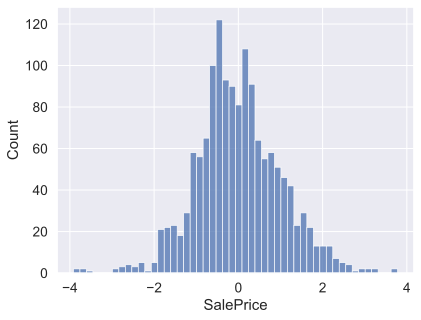

In [188]:
sns.histplot(houses['SalePrice'], bins=50)

# xticks = range(1870, 2020, 10)
# xticklabels = [str(x) for x in xticks]

# plt.xticks(xticks, xticklabels, rotation=90)


plt.show()

In [ ]:
 from sklearn.preprocessing import KBinsDiscretizer

# Zakresy kategorii
bin_edges = np.concatenate((np.linspace(0, 250000, 5), np.array([np.inf])))

# Inicjalizuj KBinsDiscretizer
discretizer = KBinsDiscretizer(n_bins=5, encode="ordinal", strategy="uniform", bins=[bin_edges])

# Dokonaj dyskretyzacji
houses['SalePriceCategory'] = discretizer.fit_transform(houses['SalePrice'].values.reshape(-1, 1))

# Wyświetl wykres
sns.countplot(data=houses, x='SalePriceCategory')
plt.xlabel("Sale price category")
plt.ylabel("Number of prices in category")
plt.grid(True)
plt.show()


/Users/joannaadamczyk/opt/anaconda3/envs/ML/lib/python3.9/site-packages/sklearn/preprocessing/_discretization.py:248: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


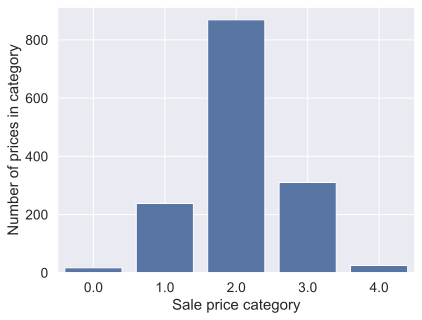

In [192]:
sale_price_disc = KBinsDiscretizer(n_bins=5, encode="ordinal", strategy="uniform")

houses['SalePriceCategory'] = sale_price_disc.fit_transform(houses['SalePrice'].values.reshape(-1, 1))

sns.countplot(data=houses, x='SalePriceCategory')
plt.xlabel("Sale price category")
plt.ylabel("Number of prices in category")
plt.grid(True)
plt.show()


In [194]:
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(houses, 
                                       test_size=0.2, 
                                       random_state=42)

strat_train_set, strat_test_set = train_test_split(houses, 
                                                    test_size=0.2, 
                                                    stratify=houses['SalePriceCategory'], 
                                                    random_state=42)

In [195]:
compared_proportions = h.compare_proportions(houses, strat_train_set, train_set, 'SalePriceCategory')
(compared_proportions * 100).round(2)

,Overall %,Stratified %,Random %,Strat. Error %,Rand. Error %
SalePriceCategory,,,,,
0.0,1.17,1.20,1.20,2.96,2.96
1.0,16.31,16.28,16.62,-0.19,1.91
2.0,59.56,59.55,58.95,-0.01,-1.02
3.0,21.25,21.25,21.85,0.02,2.84
4.0,1.71,1.71,1.37,0.02,-19.99


In [196]:
for set_ in (strat_train_set, train_set, strat_test_set, test_set, houses):
    set_.drop("SalePriceCategory", axis=1, inplace=True)

In [197]:
data_train = strat_train_set.drop("SalePrice", axis=1)
data_train_labels = strat_train_set["SalePrice"].copy()